# Librerias

In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

pd.set_option('display.max_columns', None)

import matplotlib.pyplot as plt #gráficos
from sklearn.neural_network import MLPRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from math import sqrt
import seaborn as sns

import torch
from torch.utils.data import Dataset, DataLoader
import torch.nn as nn
import torch.optim as optim
from sklearn.preprocessing import StandardScaler
import random
import os


In [2]:
import warnings
warnings.filterwarnings('ignore')

In [3]:
if torch.cuda.is_available():
    print("Utilizamos la primera GPU disponible")
    DEVICE=device = torch.device('cuda:0')
    os.environ["CUDA_LAUNCH_BLOCKING"] = "1"
else:
    print("No hay GPU, toca correr todo en CPU")
    DEVICE=device = torch.device('cpu')

DEVICE

No hay GPU, toca correr todo en CPU


device(type='cpu')

In [4]:
os.environ["CUDA_LAUNCH_BLOCKING"] = "1" if torch.cuda.is_available() else "0"

In [5]:
def reset_seed():
    SEED = 42
    torch.backends.cudnn.enabled = True
    torch.manual_seed(SEED)
    np.random.seed(SEED)
    random.seed(SEED)

    if torch.cuda.is_available():
        torch.cuda.manual_seed(SEED)
        torch.cuda.manual_seed_all(SEED)
        torch.backends.cudnn.deterministic = True
        torch.backends.cudnn.benchmark = False

In [6]:
reset_seed()

# Carga de datos

In [7]:
df = pd.read_parquet('C:/Users/allc0363/OneDrive/MCD - Icesi/Semestre 2/Fundamentos 2/Taller 2/Data/df_train.parquet')
print(df.shape)

(3680, 20)


In [8]:
# Establecemos una variable que se llame fecha, donde solo se tienen en cuenta el año y el mes

df['fecha'] = df['anio'].astype(str) + df['semana'].astype(str).str.zfill(2)
df = df.sort_values(by=['fecha','id_bar'])

In [9]:
df.head(5)

,id,id_bar,anio,semana,ESTRATO,area_barrio,dengue,concentraciones,vivienda,equipesado,sumideros,maquina,lluvia_mean,lluvia_var,lluvia_max,lluvia_min,temperatura_mean,temperatura_var,temperatura_max,temperatura_min,fecha
9,0_2015_01,0,2015,1,2.0,1.196,0.0,0.0,0.0,0.0,0.0,0.0,0.000651,0.000041,0.0625,0.0,26.163889,11.588928,31.8,20.9,201501
7,1_2015_01,1,2015,1,1.0,0.600,0.0,0.0,0.0,0.0,0.0,0.0,0.000651,0.000041,0.0625,0.0,26.163889,11.588928,31.8,20.9,201501
5,2_2015_01,2,2015,1,2.0,0.780,0.0,0.0,0.0,0.0,0.0,0.0,0.000651,0.000041,0.0625,0.0,26.163889,11.588928,31.8,20.9,201501
2,3_2015_01,3,2015,1,1.0,0.781,0.0,0.0,0.0,0.0,0.0,0.0,0.000651,0.000041,0.0625,0.0,26.163889,11.588928,31.8,20.9,201501
0,4_2015_01,4,2015,1,3.0,0.560,0.0,0.0,0.0,0.0,0.0,0.0,0.000651,0.000041,0.0625,0.0,26.163889,11.588928,31.8,20.9,201501


# EDA

### 1. Validación de los datos

In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3680 entries, 9 to 3674
Data columns (total 21 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   id                3680 non-null   object 
 1   id_bar            3680 non-null   int64  
 2   anio              3680 non-null   int64  
 3   semana            3680 non-null   UInt32 
 4   ESTRATO           3680 non-null   float64
 5   area_barrio       3680 non-null   float64
 6   dengue            3680 non-null   float64
 7   concentraciones   3680 non-null   float64
 8   vivienda          3680 non-null   float64
 9   equipesado        3680 non-null   float64
 10  sumideros         3680 non-null   float64
 11  maquina           3680 non-null   float64
 12  lluvia_mean       3680 non-null   float64
 13  lluvia_var        3680 non-null   float64
 14  lluvia_max        3680 non-null   float64
 15  lluvia_min        3680 non-null   float64
 16  temperatura_mean  3680 non-null   float64
 17  

In [11]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
id_bar,3680.0,4.5,2.872672,0.0,2.0,4.5,7.0,9.0
anio,3680.0,2018.0,2.007055,2015.0,2016.0,2018.0,2020.0,2021.0
semana,3680.0,26.788043,15.179408,1.0,14.0,27.0,40.0,53.0
ESTRATO,3680.0,2.0,0.774702,1.0,1.0,2.0,3.0,3.0
area_barrio,3680.0,0.6743,0.266698,0.292,0.394,0.69,0.842,1.196
dengue,3680.0,2.609511,3.523843,0.0,0.0,1.0,3.0,29.0
concentraciones,3680.0,1.049728,5.035452,0.0,0.0,0.0,0.0,69.0
vivienda,3680.0,0.617391,3.332661,0.0,0.0,0.0,0.0,86.0
equipesado,3680.0,0.144022,0.589311,0.0,0.0,0.0,0.0,8.0
sumideros,3680.0,1.042663,1.721449,0.0,0.0,0.0,2.0,22.0


In [12]:
valores_unicos = df['lluvia_min'].unique()
print(valores_unicos)

[0.]


### 2. Análisis de Correlación General

--- Matriz de Correlación General ---


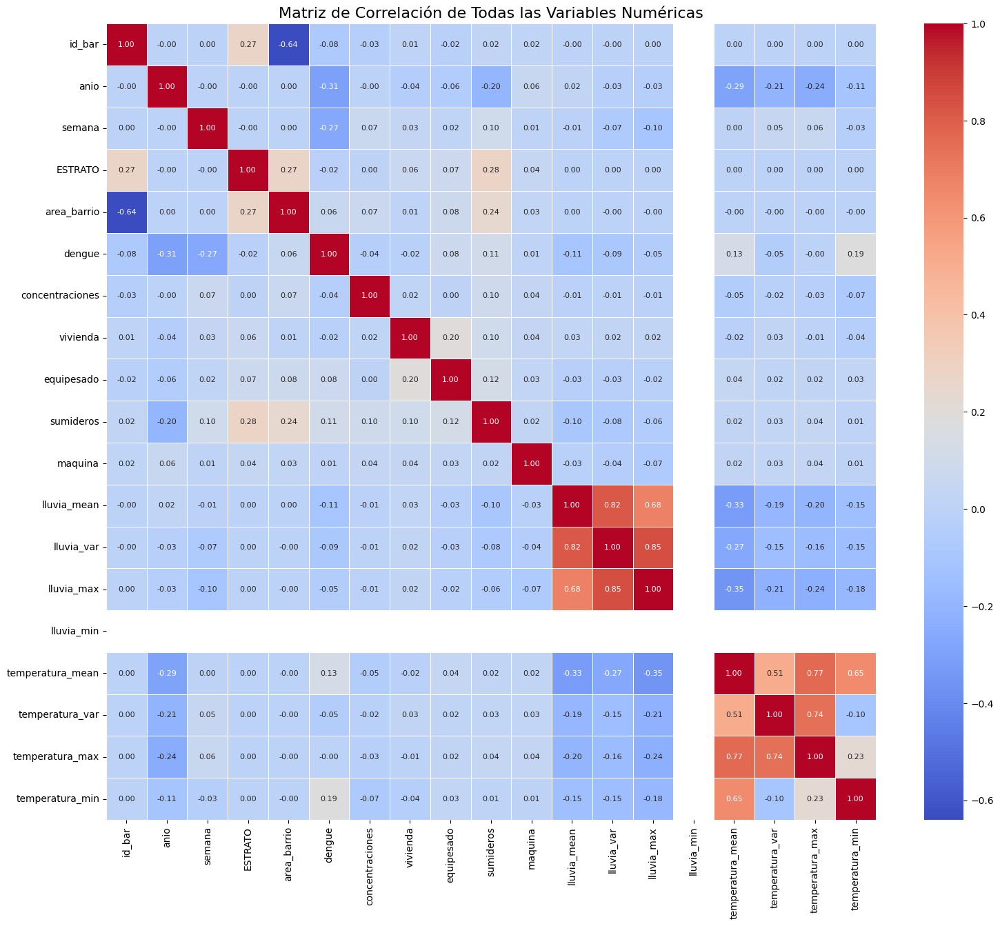

In [13]:
print("--- Matriz de Correlación General ---")
plt.figure(figsize=(18, 15))
# Excluimos las columnas no numéricas o identificadores que no aportan a la correlación
numeric_cols = df.select_dtypes(include=['number']).columns
correlation_matrix = df[numeric_cols].corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5, annot_kws={"size": 8})
plt.title('Matriz de Correlación de Todas las Variables Numéricas', fontsize=16)
plt.show()

### 3. Análisis Exploratorio por Barrio

#### Graficas por Barrio


Análisis para el Barrio ID: 0

Estadísticas Descriptivas (Dengue, Lluvia y Temperatura):
           dengue  lluvia_mean  temperatura_mean
count  368.000000   368.000000        368.000000
mean     3.315217     0.285061         25.987584
std      4.333959     0.327132          1.127706
min      0.000000     0.000000         22.599405
25%      1.000000     0.064769         25.210665
50%      2.000000     0.186290         25.890774
75%      4.000000     0.414697         26.824003
max     29.000000     2.351777         29.800000


<Figure size 1000x600 with 0 Axes>

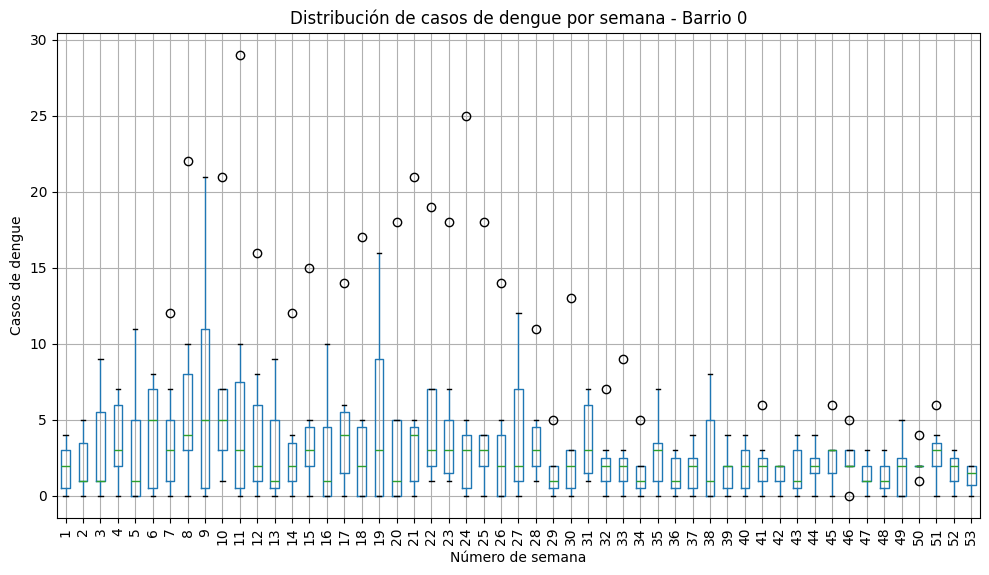


Generando gráficos para el barrio 0...


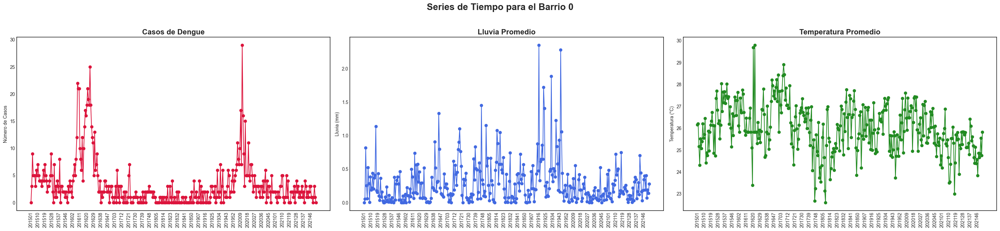

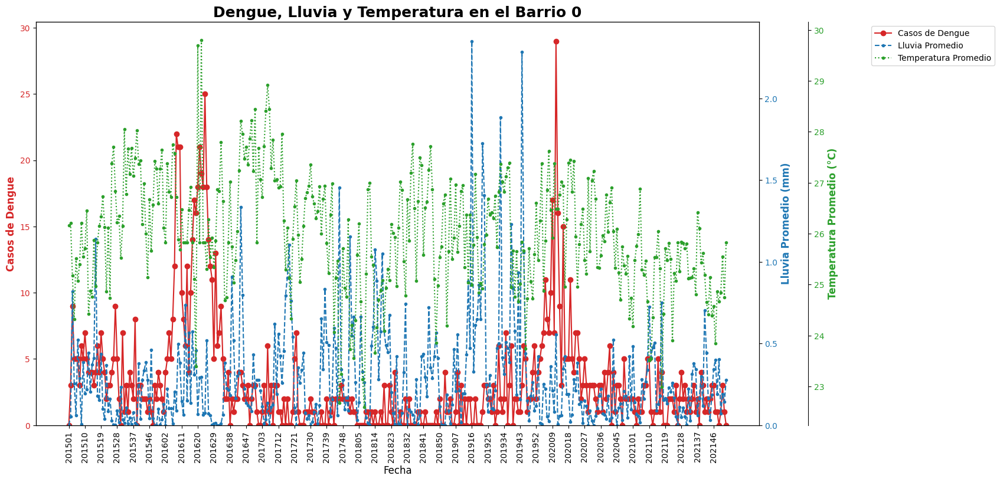


Análisis para el Barrio ID: 1

Estadísticas Descriptivas (Dengue, Lluvia y Temperatura):
           dengue  lluvia_mean  temperatura_mean
count  368.000000   368.000000        368.000000
mean     2.850543     0.285061         25.987584
std      4.026066     0.327132          1.127706
min      0.000000     0.000000         22.599405
25%      0.000000     0.064769         25.210665
50%      1.000000     0.186290         25.890774
75%      4.000000     0.414697         26.824003
max     28.000000     2.351777         29.800000


<Figure size 1000x600 with 0 Axes>

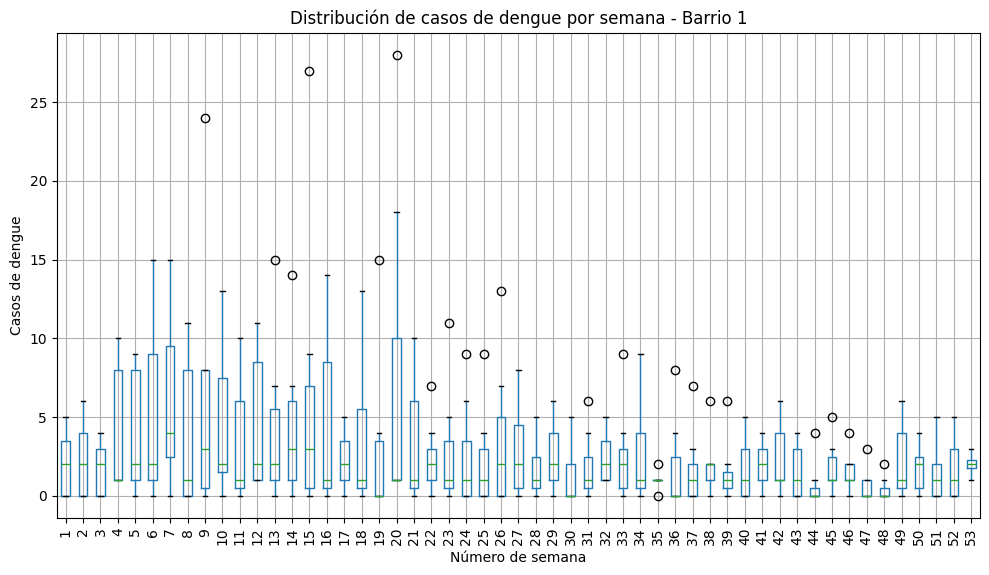


Generando gráficos para el barrio 1...


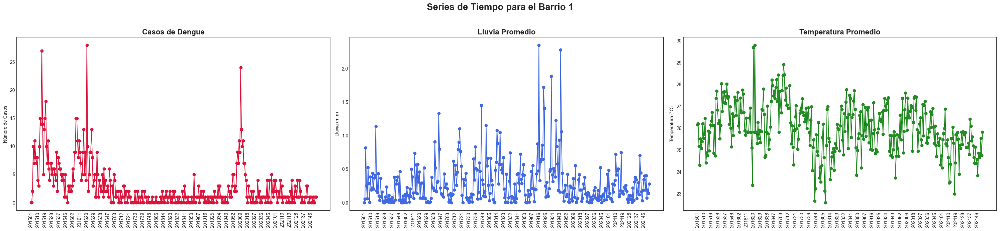

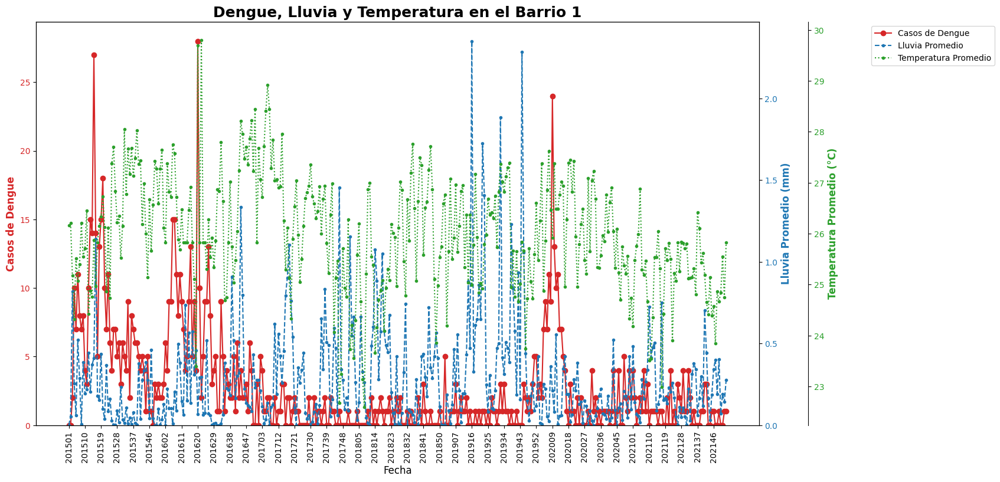


Análisis para el Barrio ID: 2

Estadísticas Descriptivas (Dengue, Lluvia y Temperatura):
           dengue  lluvia_mean  temperatura_mean
count  368.000000   368.000000        368.000000
mean     2.752717     0.285061         25.987584
std      3.660861     0.327132          1.127706
min      0.000000     0.000000         22.599405
25%      0.000000     0.064769         25.210665
50%      1.000000     0.186290         25.890774
75%      4.000000     0.414697         26.824003
max     26.000000     2.351777         29.800000


<Figure size 1000x600 with 0 Axes>

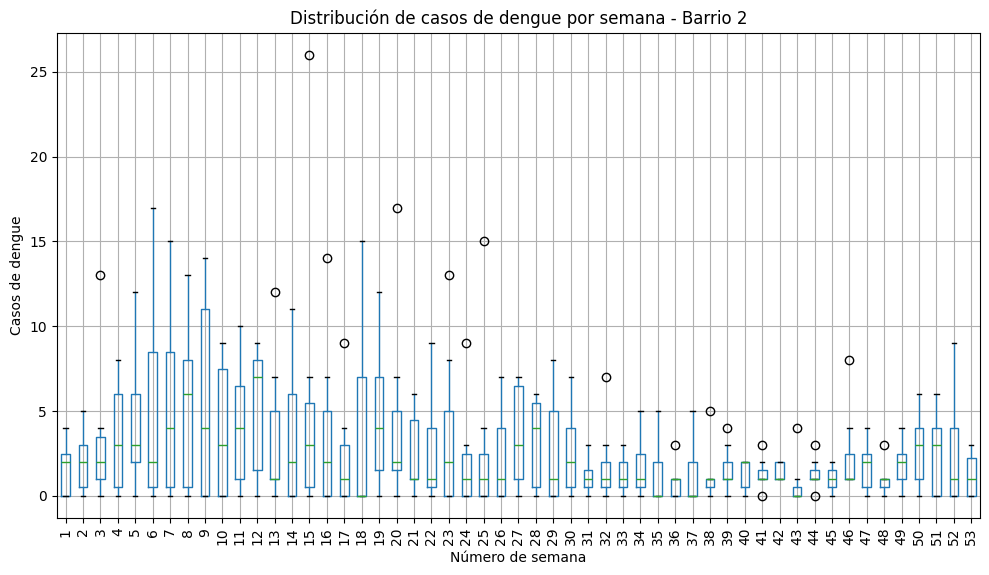


Generando gráficos para el barrio 2...


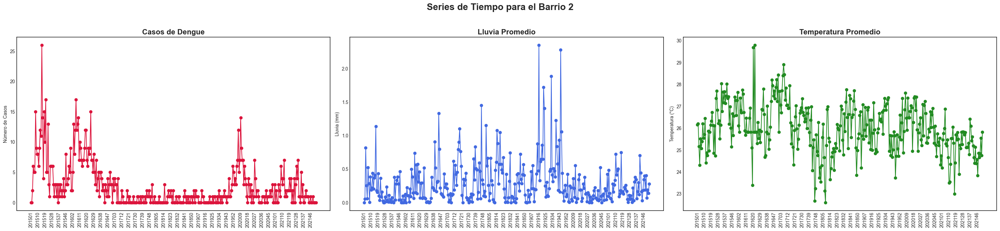

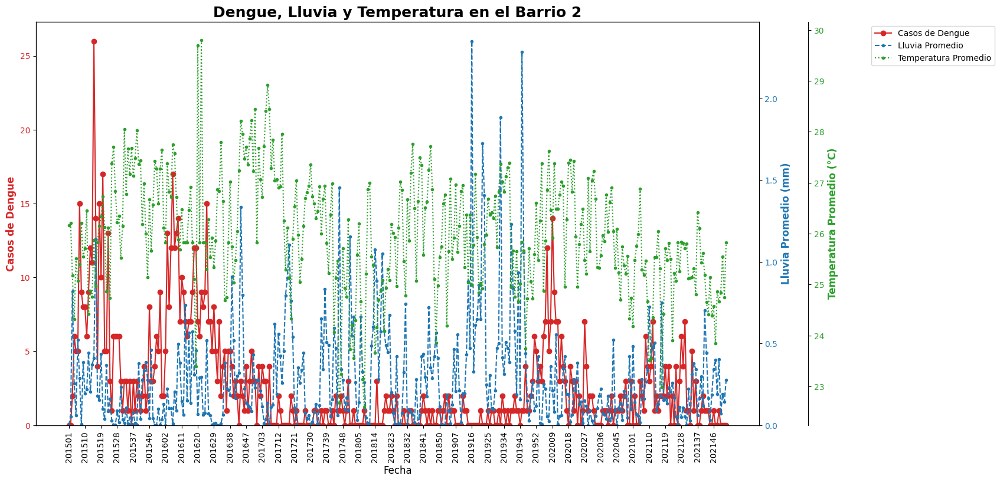


Análisis para el Barrio ID: 3

Estadísticas Descriptivas (Dengue, Lluvia y Temperatura):
           dengue  lluvia_mean  temperatura_mean
count  368.000000   368.000000        368.000000
mean     2.668478     0.285061         25.987584
std      3.250468     0.327132          1.127706
min      0.000000     0.000000         22.599405
25%      0.000000     0.064769         25.210665
50%      2.000000     0.186290         25.890774
75%      4.000000     0.414697         26.824003
max     18.000000     2.351777         29.800000


<Figure size 1000x600 with 0 Axes>

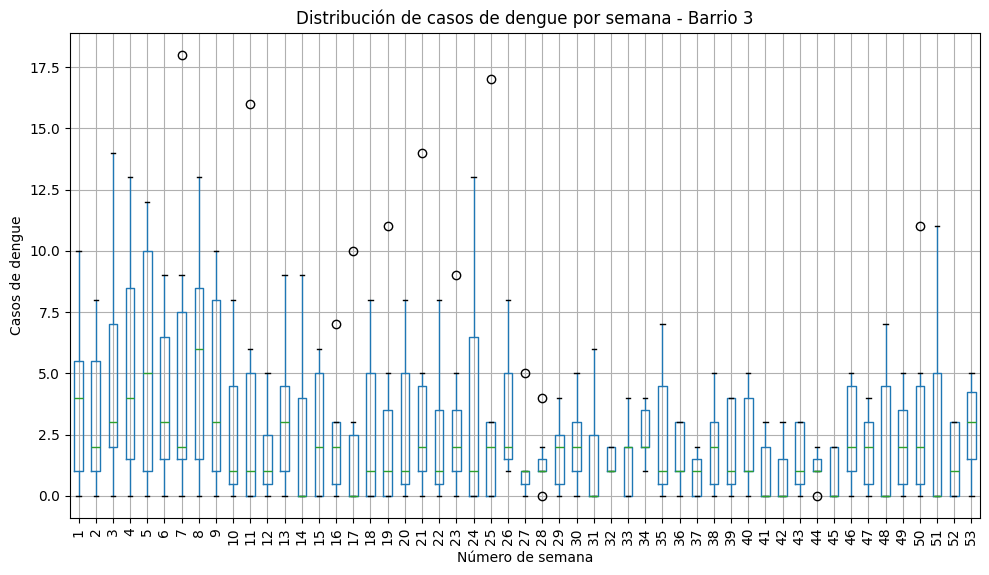


Generando gráficos para el barrio 3...


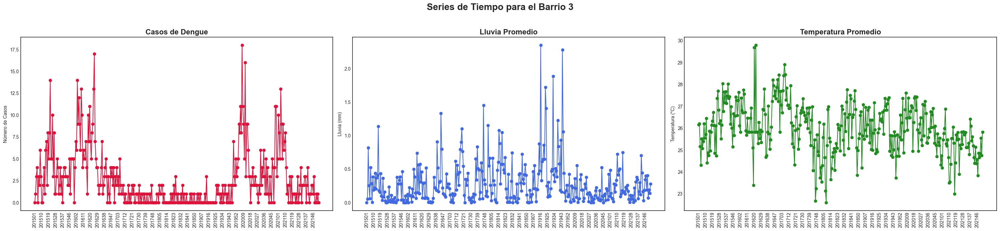

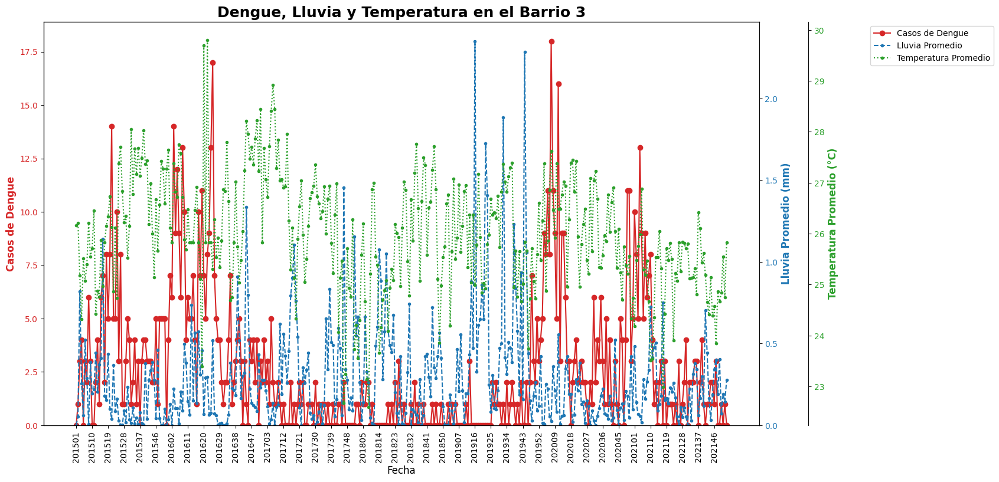


Análisis para el Barrio ID: 4

Estadísticas Descriptivas (Dengue, Lluvia y Temperatura):
           dengue  lluvia_mean  temperatura_mean
count  368.000000   368.000000        368.000000
mean     2.605978     0.285061         25.987584
std      3.777124     0.327132          1.127706
min      0.000000     0.000000         22.599405
25%      0.000000     0.064769         25.210665
50%      1.000000     0.186290         25.890774
75%      3.000000     0.414697         26.824003
max     22.000000     2.351777         29.800000


<Figure size 1000x600 with 0 Axes>

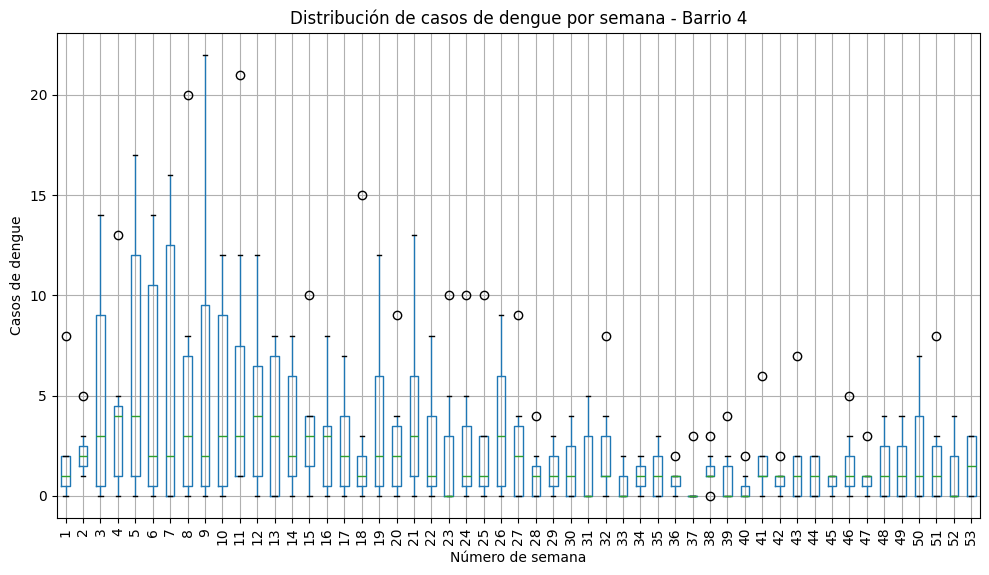


Generando gráficos para el barrio 4...


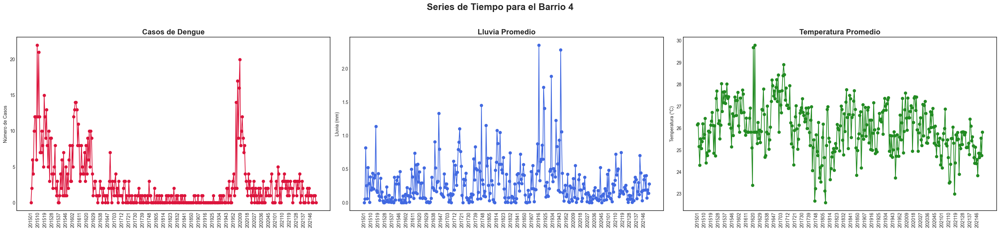

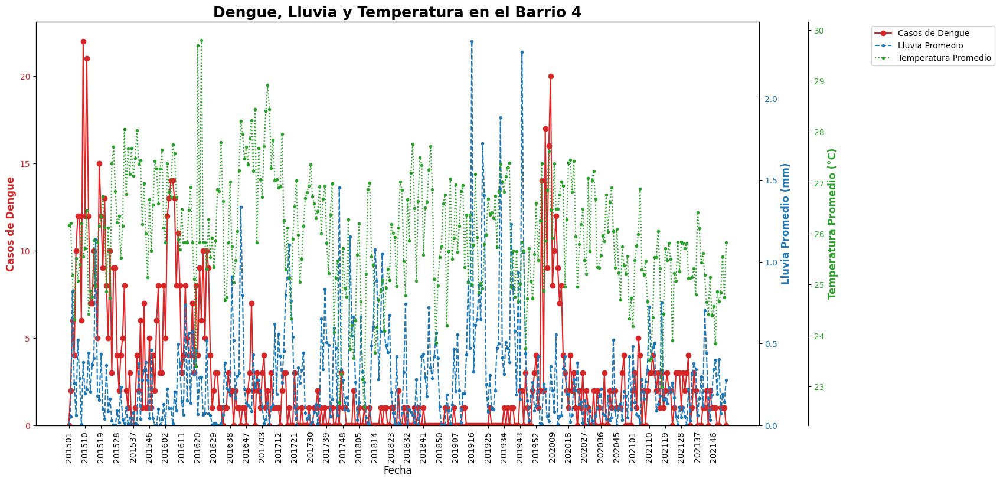


Análisis para el Barrio ID: 5

Estadísticas Descriptivas (Dengue, Lluvia y Temperatura):
           dengue  lluvia_mean  temperatura_mean
count  368.000000   368.000000        368.000000
mean     2.464674     0.285061         25.987584
std      2.877869     0.327132          1.127706
min      0.000000     0.000000         22.599405
25%      0.000000     0.064769         25.210665
50%      1.000000     0.186290         25.890774
75%      4.000000     0.414697         26.824003
max     16.000000     2.351777         29.800000


<Figure size 1000x600 with 0 Axes>

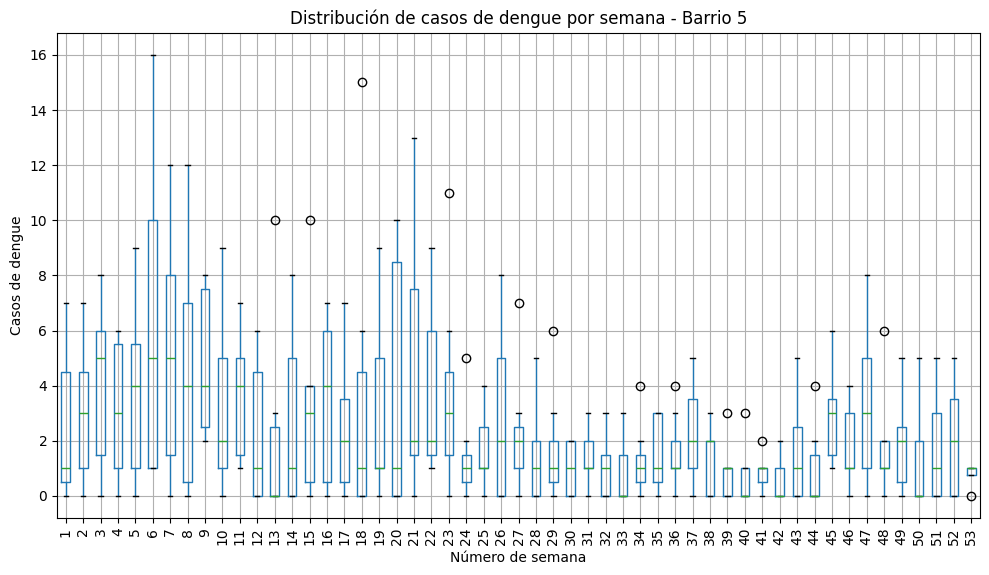


Generando gráficos para el barrio 5...


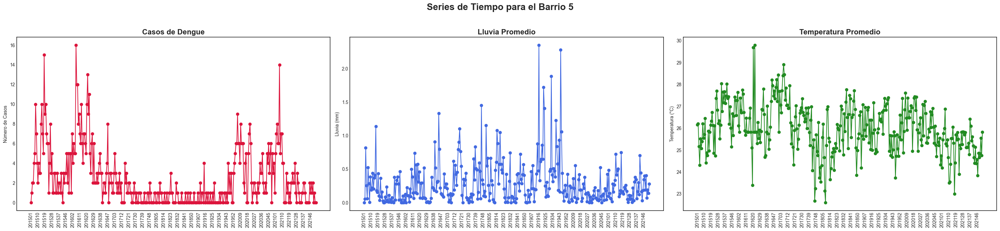

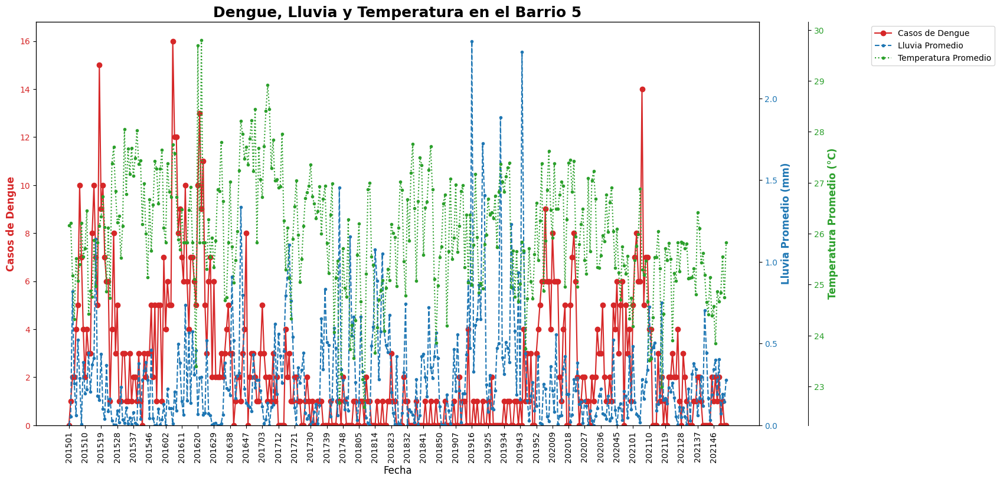


Análisis para el Barrio ID: 6

Estadísticas Descriptivas (Dengue, Lluvia y Temperatura):
           dengue  lluvia_mean  temperatura_mean
count  368.000000   368.000000        368.000000
mean     2.399457     0.285061         25.987584
std      3.183866     0.327132          1.127706
min      0.000000     0.000000         22.599405
25%      0.000000     0.064769         25.210665
50%      1.000000     0.186290         25.890774
75%      3.000000     0.414697         26.824003
max     17.000000     2.351777         29.800000


<Figure size 1000x600 with 0 Axes>

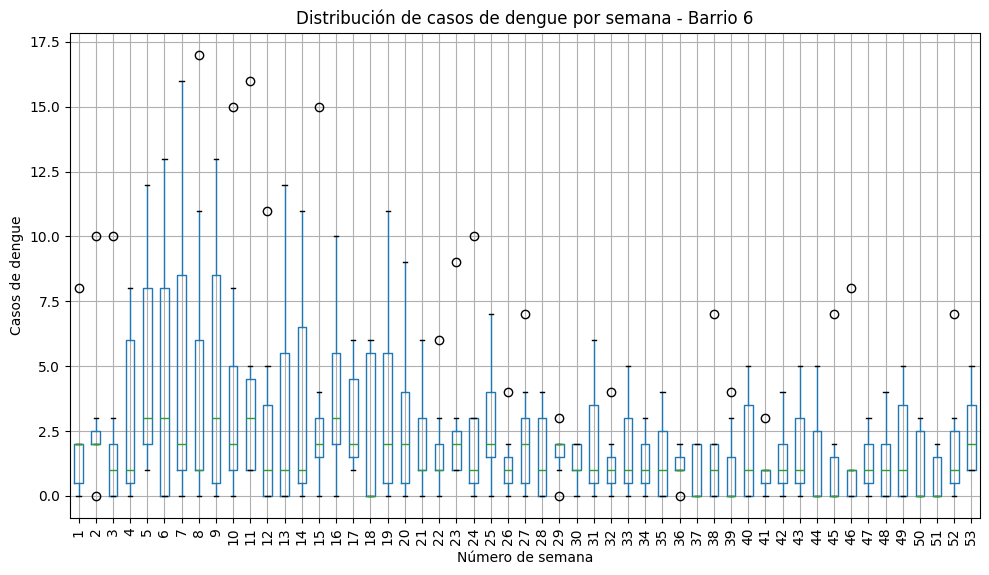


Generando gráficos para el barrio 6...


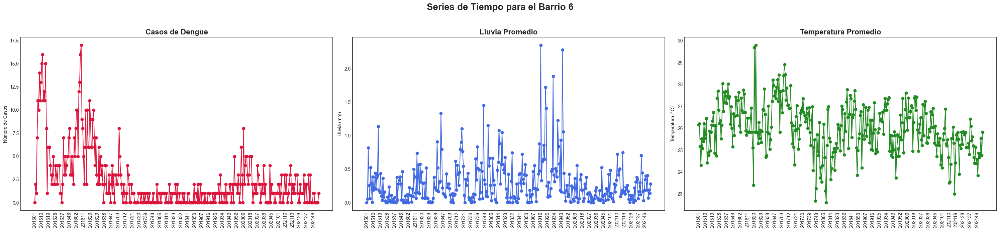

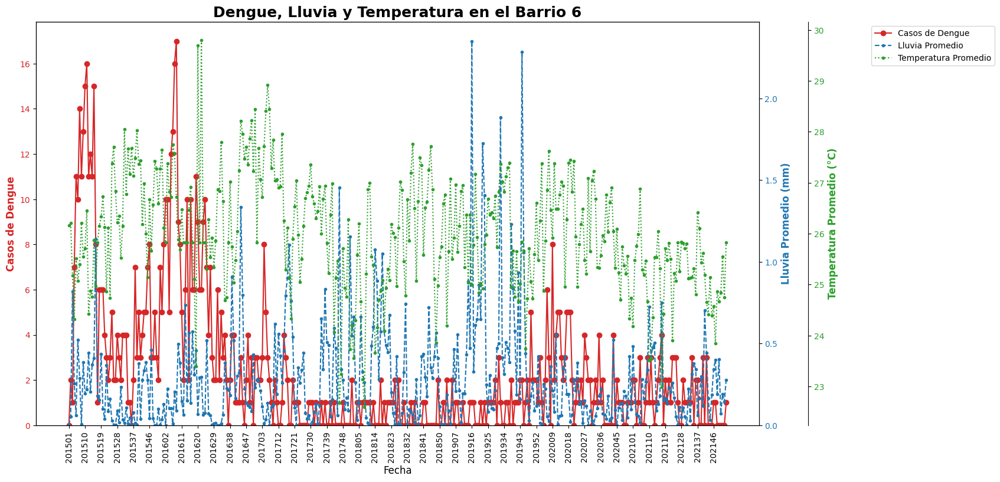


Análisis para el Barrio ID: 7

Estadísticas Descriptivas (Dengue, Lluvia y Temperatura):
           dengue  lluvia_mean  temperatura_mean
count  368.000000   368.000000        368.000000
mean     2.350543     0.285061         25.987584
std      3.096882     0.327132          1.127706
min      0.000000     0.000000         22.599405
25%      1.000000     0.064769         25.210665
50%      1.000000     0.186290         25.890774
75%      3.000000     0.414697         26.824003
max     20.000000     2.351777         29.800000


<Figure size 1000x600 with 0 Axes>

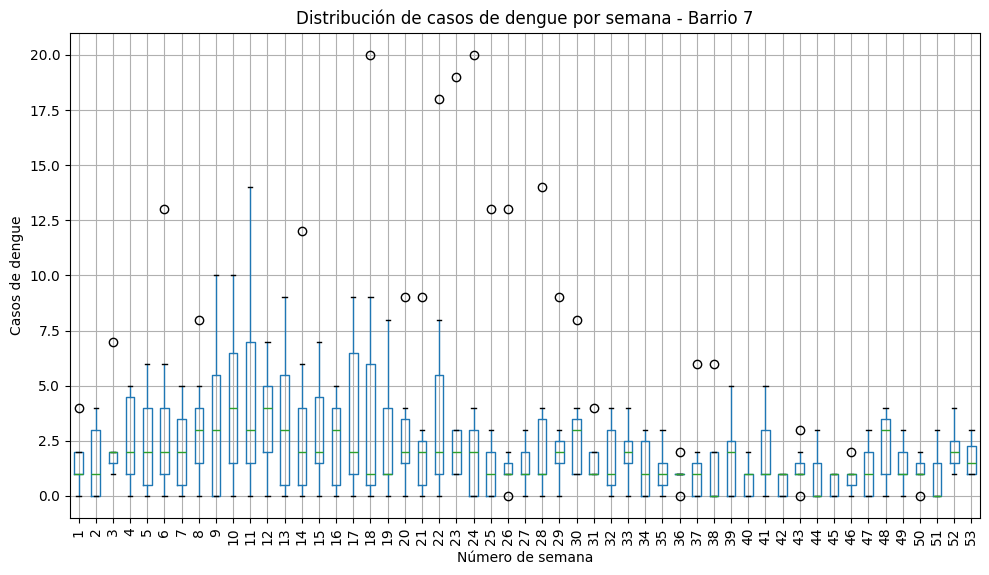


Generando gráficos para el barrio 7...


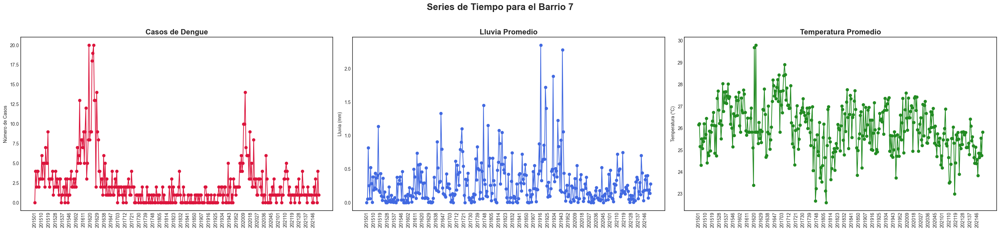

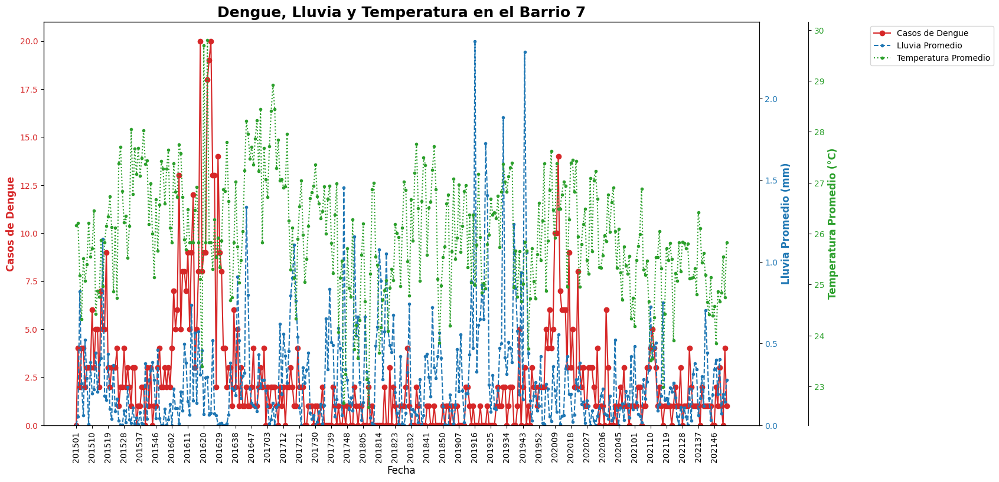


Análisis para el Barrio ID: 8

Estadísticas Descriptivas (Dengue, Lluvia y Temperatura):
           dengue  lluvia_mean  temperatura_mean
count  368.000000   368.000000        368.000000
mean     2.372283     0.285061         25.987584
std      3.501653     0.327132          1.127706
min      0.000000     0.000000         22.599405
25%      0.000000     0.064769         25.210665
50%      1.000000     0.186290         25.890774
75%      3.000000     0.414697         26.824003
max     24.000000     2.351777         29.800000


<Figure size 1000x600 with 0 Axes>

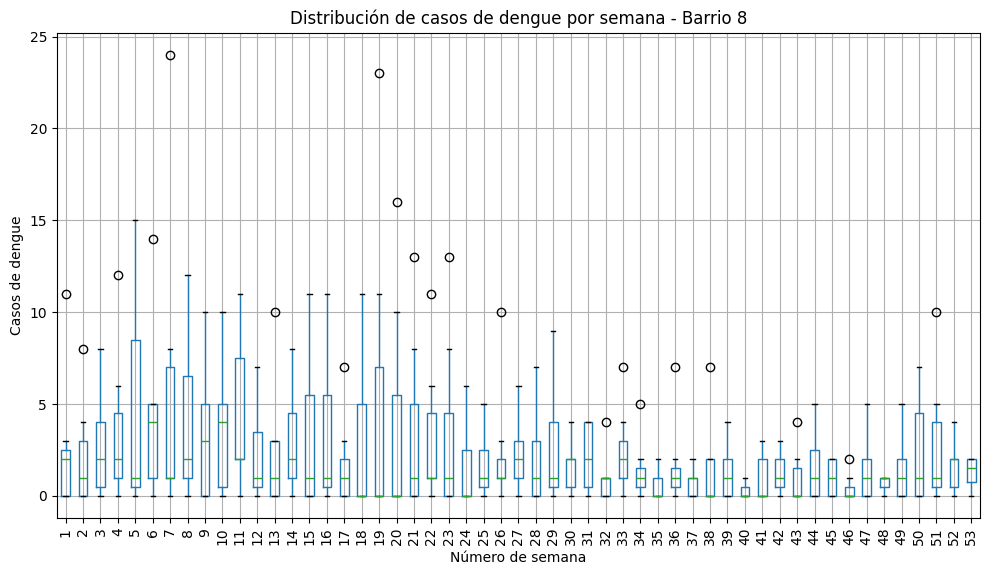


Generando gráficos para el barrio 8...


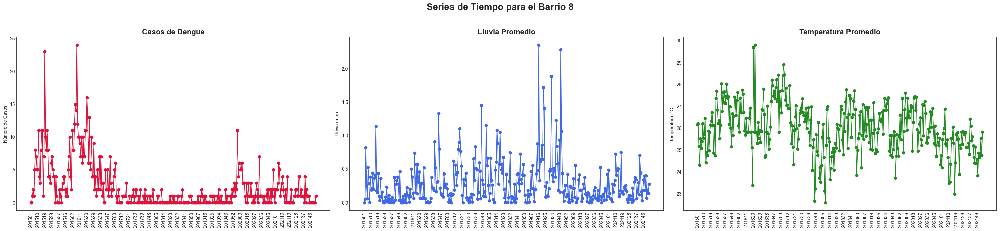

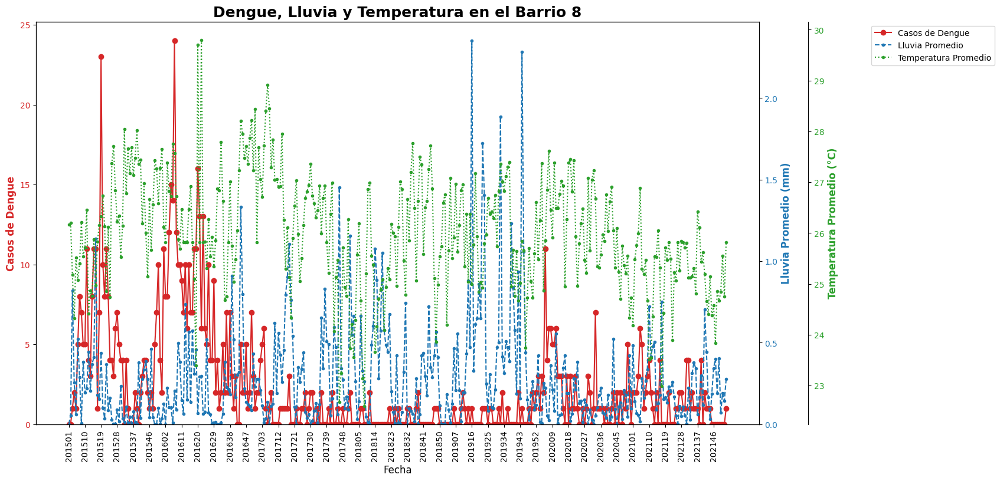


Análisis para el Barrio ID: 9

Estadísticas Descriptivas (Dengue, Lluvia y Temperatura):
           dengue  lluvia_mean  temperatura_mean
count  368.000000   368.000000        368.000000
mean     2.315217     0.285061         25.987584
std      3.181792     0.327132          1.127706
min      0.000000     0.000000         22.599405
25%      0.000000     0.064769         25.210665
50%      1.000000     0.186290         25.890774
75%      3.000000     0.414697         26.824003
max     17.000000     2.351777         29.800000


<Figure size 1000x600 with 0 Axes>

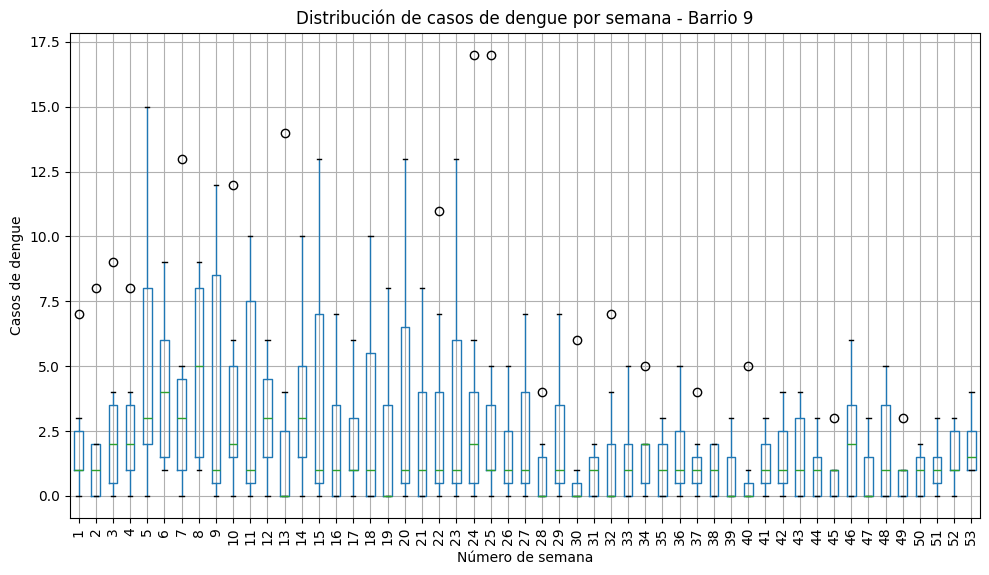


Generando gráficos para el barrio 9...


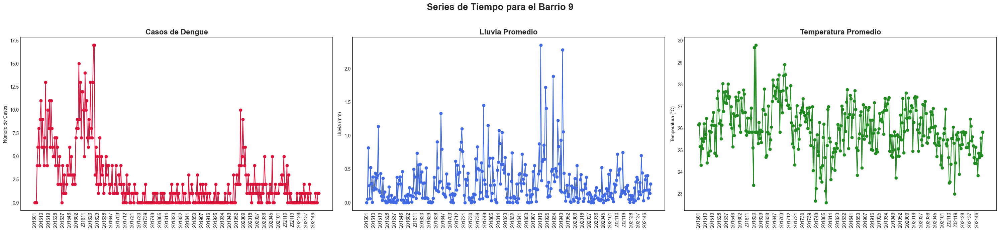

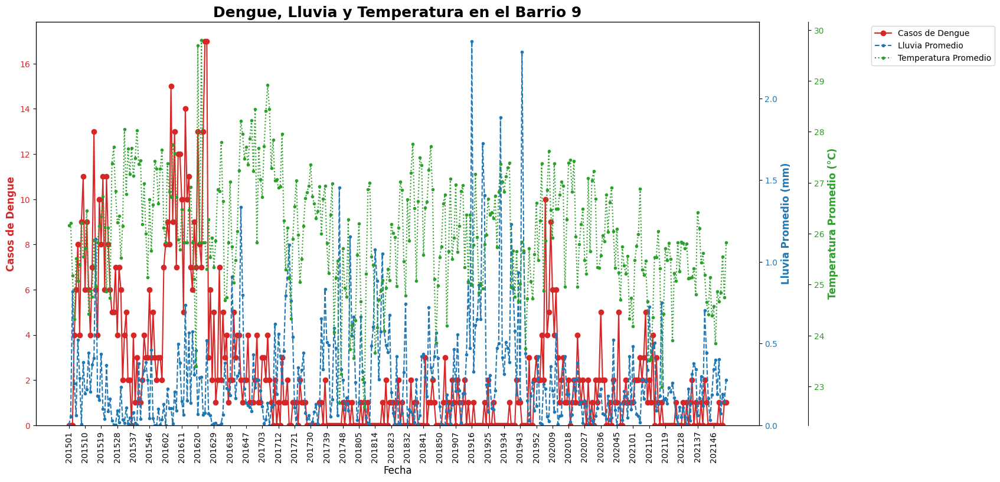

In [14]:
barrios_unicos = df['id_bar'].unique()

for barrio_id in barrios_unicos:
    # Filtra el DataFrame para el barrio actual
    df_barrio = df[df['id_bar'] == barrio_id].copy()
    
    # Ordena por fecha para asegurar que los gráficos de series de tiempo sean correctos
    df_barrio.sort_values('fecha', inplace=True)
    
    # No procesar si no hay suficientes datos para el barrio
    if len(df_barrio) < 2:
        print(f"\nNo hay suficientes datos para analizar el barrio {barrio_id}.")
        continue

    print(f"\n{'='*70}")
    print(f"Análisis para el Barrio ID: {barrio_id}")
    print(f"{'='*70}")

    # --- Estadísticas Descriptivas ---
    print("\nEstadísticas Descriptivas (Dengue, Lluvia y Temperatura):")
    print(df_barrio[['dengue', 'lluvia_mean', 'temperatura_mean']].describe())

    # --- Grrafico 0: Distribución de casos de dengue por semana - Barrio ---

    # Extraer la semana desde la columna 'fecha' si no existe
    if 'week' not in df_barrio.columns:
        df_barrio['week'] = df_barrio['fecha'].str[4:].astype(int)

    # Generar el boxplot de casos de dengue por semana
    plt.figure(figsize=(10, 6))
    df_barrio.boxplot(column='dengue', by='week', figsize=(10, 6))
    plt.title(f'Distribución de casos de dengue por semana - Barrio {barrio_id}')
    plt.xlabel('Número de semana')
    plt.ylabel('Casos de dengue')
    plt.suptitle('')  # Elimina el título extra de boxplot
    plt.xticks(rotation=90)
    plt.tight_layout()
    plt.show()
    
    # --- Gráfico 1: Serie de Tiempo de Casos de Dengue, Lluvia y Temperatura ---
    print(f"\nGenerando gráficos para el barrio {barrio_id}...")
    plt.style.use('seaborn-v0_8-white')
    fig, axes = plt.subplots(1, 3, figsize=(30, 7))
    fig.suptitle(f'Series de Tiempo para el Barrio {barrio_id}', fontsize=20, fontweight='bold')

    # Subplot 1: Casos de Dengue
    axes[0].plot(df_barrio['fecha'], df_barrio['dengue'], marker='o', linestyle='-', color='crimson')
    axes[0].set_title('Casos de Dengue', fontsize=16, fontweight='bold')
    axes[0].set_ylabel('Número de Casos')
    axes[0].tick_params(axis='x', rotation=90)
    axes[0].set_xticks(np.arange(0, 368, 9))  # <- Corregido aquí

    # Subplot 2: Lluvia Promedio
    axes[1].plot(df_barrio['fecha'], df_barrio['lluvia_mean'], marker='o', linestyle='-', color='royalblue')
    axes[1].set_title('Lluvia Promedio', fontsize=16, fontweight='bold')
    axes[1].set_ylabel('Lluvia (mm)')
    axes[1].tick_params(axis='x', rotation=90)
    axes[1].set_xticks(np.arange(0, 368, 9))  # <- Corregido aquí

    # Subplot 3: Temperatura Promedio
    axes[2].plot(df_barrio['fecha'], df_barrio['temperatura_mean'], marker='o', linestyle='-', color='forestgreen')
    axes[2].set_title('Temperatura Promedio', fontsize=16, fontweight='bold')
    axes[2].set_ylabel('Temperatura (°C)')
    axes[2].tick_params(axis='x', rotation=90)
    axes[2].set_xticks(np.arange(0, 368, 9))  # <- También puede ir aquí

    # Ajusta el espaciado para que las etiquetas no se encimen
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()  

    # --- Gráfico 2: Dengue vs. Variables Climáticas (Combinado) ---
    #plt.style.use('seaborn-v0_8-whitegrid')
    plt.style.use('default')
    fig, ax1 = plt.subplots(figsize=(16, 8))

    # Eje 1: Casos de Dengue
    color = 'tab:red'
    ax1.set_xlabel('Fecha', fontsize=12)
    ax1.set_ylabel('Casos de Dengue', color=color, fontsize=12, fontweight='bold')
    ax1.plot(df_barrio['fecha'], df_barrio['dengue'], color=color, marker='o', linestyle='-', label='Casos de Dengue')
    ax1.tick_params(axis='y', labelcolor=color)
    ax1.set_xticks(np.arange(0, 368, 9))
    ax1.tick_params(axis='x', rotation=90) # Rotamos 45 para el combinado que es más ancho
    ax1.set_ylim(bottom=0)

    # Eje 2: Lluvia Promedio
    ax2 = ax1.twinx()
    color = 'tab:blue'
    ax2.set_ylabel('Lluvia Promedio (mm)', color=color, fontsize=12, fontweight='bold')
    ax2.plot(df_barrio['fecha'], df_barrio['lluvia_mean'], color=color, marker='.', linestyle='--', label='Lluvia Promedio')
    ax2.tick_params(axis='y', labelcolor=color)
    ax2.set_ylim(bottom=0)

    # Eje 3: Temperatura Promedio
    ax3 = ax1.twinx()
    ax3.spines['right'].set_position(('outward', 60))
    color = 'tab:green'
    ax3.set_ylabel('Temperatura Promedio (°C)', color=color, fontsize=12, fontweight='bold')
    ax3.plot(df_barrio['fecha'], df_barrio['temperatura_mean'], color=color, marker='.', linestyle=':', label='Temperatura Promedio')
    ax3.tick_params(axis='y', labelcolor=color)

    fig.tight_layout(rect=[0, 0, 0.9, 1])
    plt.title(f'Dengue, Lluvia y Temperatura en el Barrio {barrio_id}', fontsize=18, fontweight='bold')
    
    # Combinar leyendas de los 3 ejes
    lines, labels = ax1.get_legend_handles_labels()
    lines2, labels2 = ax2.get_legend_handles_labels()
    lines3, labels3 = ax3.get_legend_handles_labels()
    ax3.legend(lines + lines2 + lines3, labels + labels2 + labels3, loc='upper left', bbox_to_anchor=(1.15, 1))

    plt.show()

#### Autocorrelación semanal de casos de dengue

In [21]:
# Asegúrate de que 'fecha' sea string
df['fecha'] = df['fecha'].astype(str)

# Extrae año y semana
df['anio'] = df['fecha'].str[:4].astype(int)
df['semana'] = df['fecha'].str[4:].astype(int)

# Crea columna datetime desde año y semana (ISO week)
df['fecha_dt'] = pd.to_datetime(df['anio'].astype(str) + df['semana'].astype(str) + '1', format='%G%V%u')

%matplotlib inline


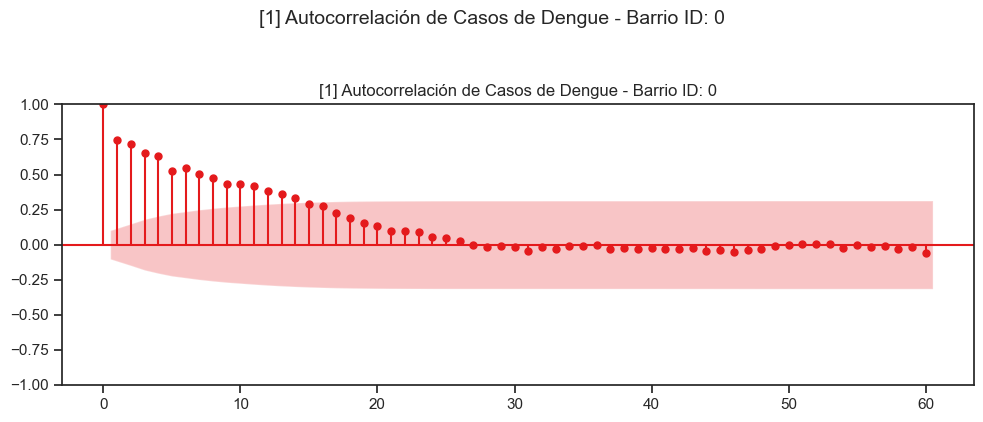

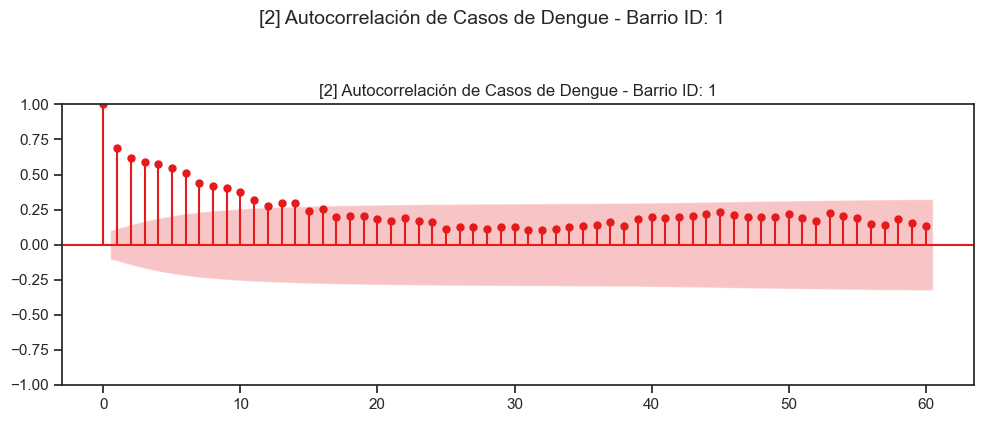

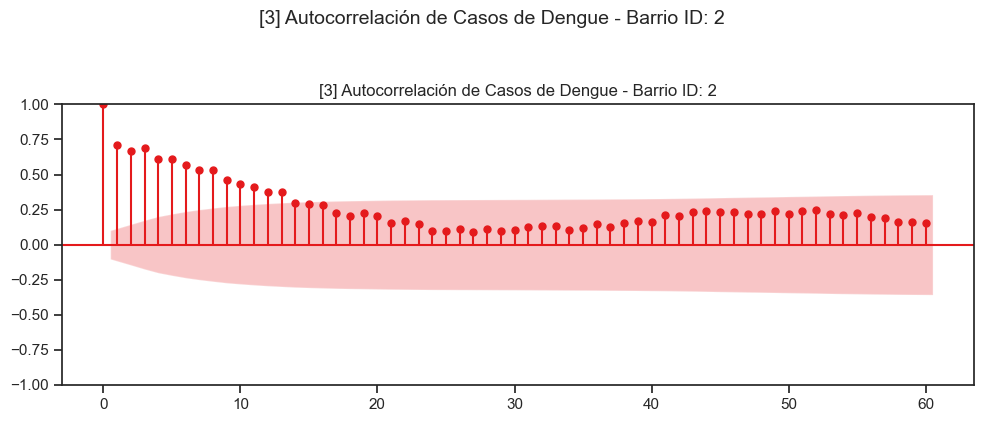

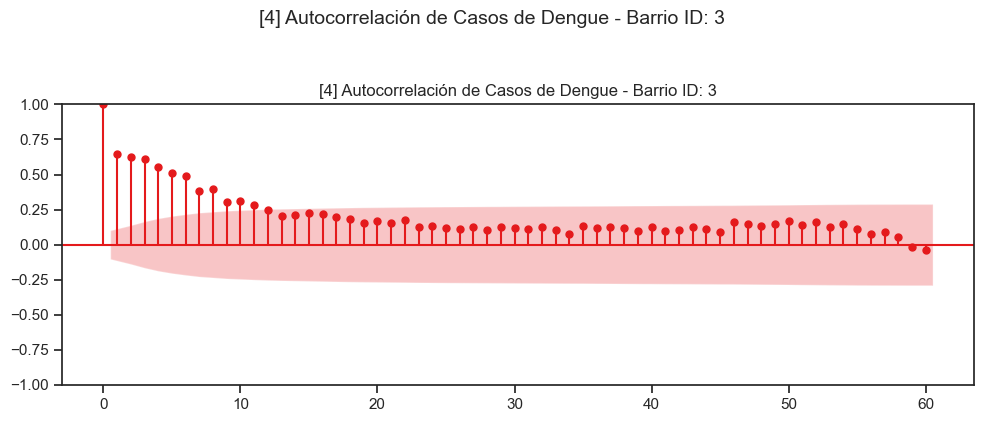

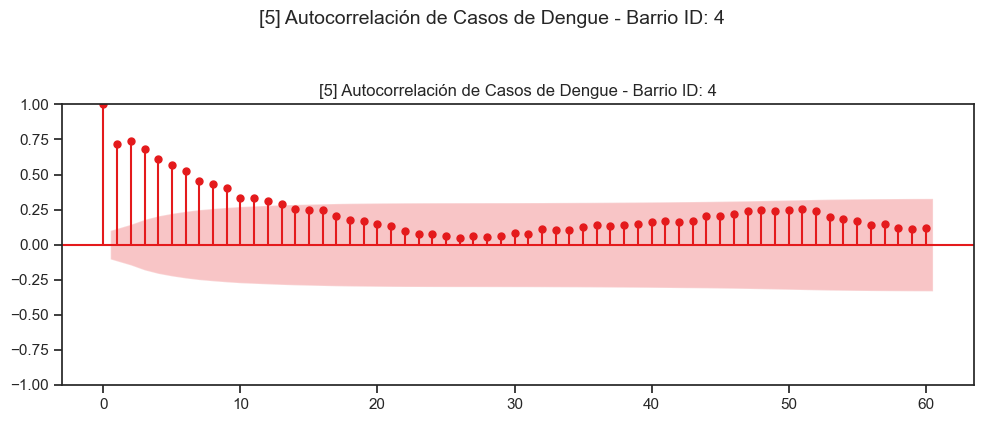

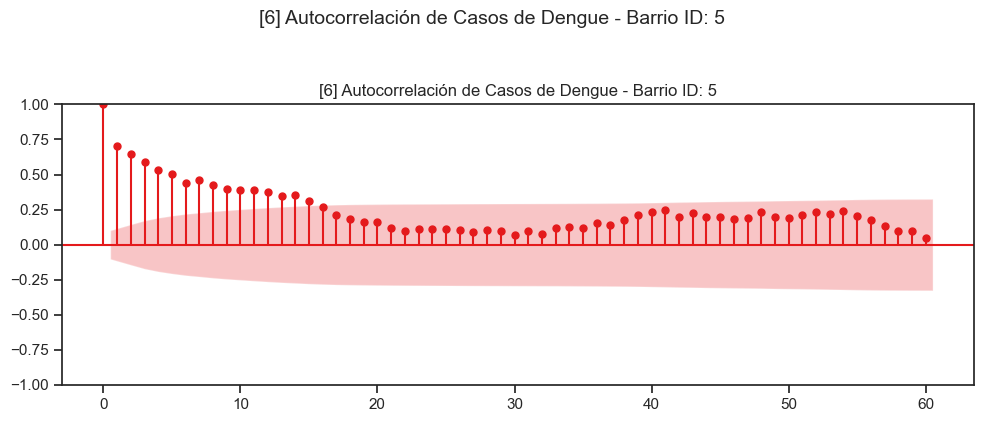

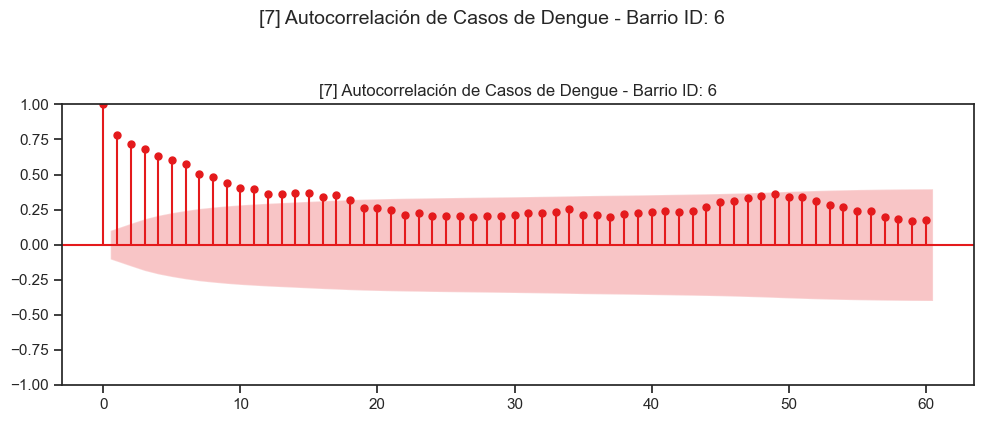

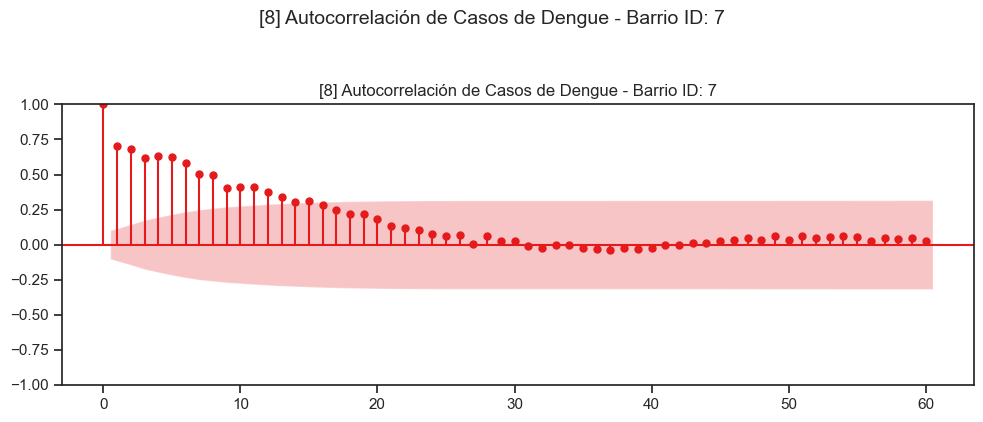

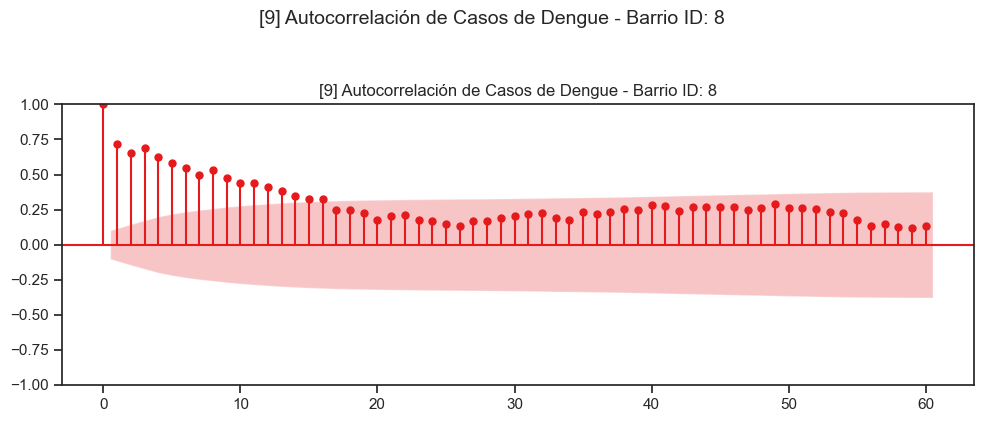

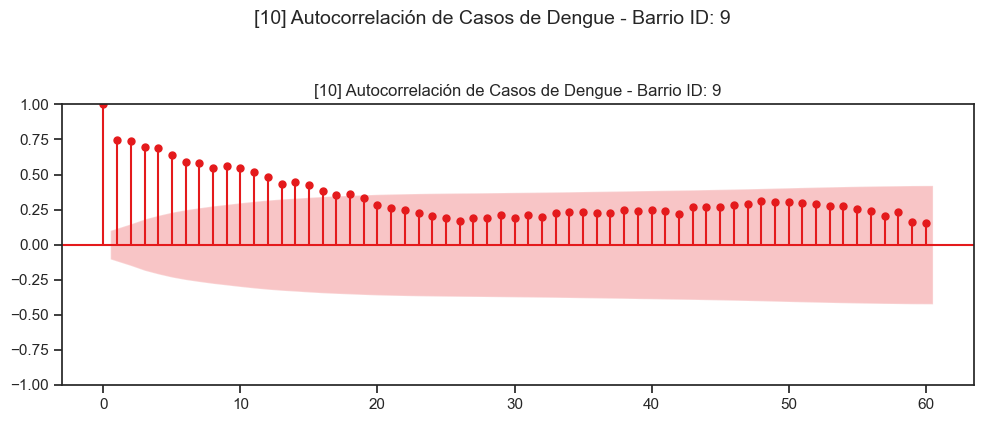

In [23]:
from statsmodels.graphics.tsaplots import plot_acf
import matplotlib.pyplot as plt

for idx, barrio in enumerate(sorted(df['id_bar'].unique())):
    serie = df[df['id_bar'] == barrio].sort_values('fecha_dt')['dengue']

    fig, ax = plt.subplots(figsize=(10, 4))
    plot_acf(serie, lags=60, ax=ax)
    
    titulo = f'[{idx+1}] Autocorrelación de Casos de Dengue - Barrio ID: {barrio}'
    ax.set_title(titulo, fontsize=12)
    plt.suptitle(titulo, fontsize=14, y=1.05)  # Título superior para mayor claridad
    
    plt.tight_layout()
    plt.show()


### 4. Interpretación Análisis Exploratorio

#### **Análisis General del Dataset** ####

*Características del Dataset:*

* Período temporal: 2015-2021 (7 años)
* Frecuencia: Semanal (53 semanas por año)
* Total observaciones: 3,680 registros
* Barrios analizados: 10 (ID: 0-9)
* Observaciones por barrio: 368 semanas cada uno

*Variables Clave para Predicción:*

* Variable objetivo: dengue (casos semanales)
* Variables climáticas: lluvia_mean, temperatura_mean
* Variables de control vectorial: concentraciones, vivienda, equipesado, sumideros, maquina
* Variables socioeconómicas: ESTRATO, area_barrio

#### **Análisis Detallado por Barrio**

*Barrio 0 - Perfil de Alto Riesgo:*

* Media dengue: 3.32 casos/semana (la más alta)
* Desviación estándar: 4.33 (alta variabilidad)
* Rango: 0-29 casos (pico máximo más alto)
* Características:
    * Serie NO estacionaria con alta volatilidad
    * Presencia de picos extremos (hasta 29 casos)
    * Alta variabilidad estacional
    * Comportamiento más errático y difícil de predecir



*Barrio 1 - Perfil Moderado-Alto:*

* Media dengue: 2.85 casos/semana
* Desviación estándar: 4.03
* Rango: 0-28 casos
* Características:
    * Serie con estacionalidad moderada
    * Picos significativos pero ligeramente más controlados
    * Comportamiento similar al Barrio 0 pero con menor intensidad



*Barrios 2-3 - Perfil Intermedio:*

* Media dengue: ~2.7 casos/semana
* Desviación estándar: 3.25-3.66
* Características:
    * Estacionalidad más definida
    * Menor variabilidad que los barrios 0-1
    * Picos moderados (máx. 18-26 casos)
    * Series más predecibles



*Barrios 4-9 - Perfil de Menor Incidencia:*

* Media dengue: 2.3-2.6 casos/semana
* Desviación estándar: 2.88-3.78
* Rango máximo: 16-24 casos
* Características:
    * Mayor estabilidad temporal
    * Estacionalidad más clara
    * Menor volatilidad
    * Patrones más regulares

#### **Análisis de Patrones Temporales**

*Estacionalidad Identificada:*
Todos los barrios muestran **patrones estacionales claros** relacionados con:

* Períodos de lluvia (correlación visible en los gráficos)
* Variaciones de temperatura
* Ciclos anuales repetitivos

*Tendencias Observadas:*

* No hay tendencia lineal clara a largo plazo
* Ciclos recurrentes anuales
* Volatilidad variable entre barrios
* Autocorrelación temporal evidente

#### **Propuesta de Agrupación de Barrios**

*Grupo 1: Alta Volatilidad (Barrios 0-1):*

* Características: Alta media, alta variabilidad, picos extremos
* Desafío: Predicción compleja por irregularidad
* Sequence Length recomendado: 12-16 semanas

*Grupo 2: Volatilidad Moderada (Barrios 2-3):*

* Características: Media intermedia, estacionalidad definida
* Comportamiento: Más predecible que Grupo 1
* Sequence Length recomendado: 8-12 semanas

*Grupo 3: Baja Volatilidad (Barrios 4-9):*

* Características: Media más baja, mayor estabilidad
* Ventaja: Patrones más regulares y predecibles
* Sequence Length recomendado: 6-10 semanas

#### **Estructura Temporal Óptima Recomendada**

**Grupo 1 (Barrios 0-1)**
*SEQUENCE_LENGTH = 14 semanas*
*- Justificación técnica:*

* Alta volatilidad requiere más contexto histórico
* Picos irregulares necesitan ventana amplia para detectar patrones
* Estacionalidad compleja requiere al menos un trimestre de datos
* Memoria a largo plazo necesaria para capturar dependencias lejanas

**Grupo 2 (Barrios 2-3)**
*SEQUENCE_LENGTH = 10 semanas*
*- Justificación técnica:*

* Estacionalidad más regular permite ventana media
* Balance entre contexto y eficiencia computacional
* Patrones semi-predecibles con ciclos de ~2-3 meses
* Reducción de ruido sin perder información relevante

**Grupo 3 (Barrios 4-9)**
*SEQUENCE_LENGTH = 8 semanas*
*- Justificación técnica:*

* Mayor estabilidad permite ventanas más cortas
* Patrones más regulares requieren menos contexto histórico
* Eficiencia computacional sin pérdida de precisión
* Menor riesgo de sobreajuste con datos más estables

In [ ]:
'''
🧠 Consideraciones para Redes Neuronales
Arquitectura Recomendada

LSTM/GRU bidireccional para capturar dependencias temporales
Attention mechanism para picos irregulares (Grupos 1-2)
Features multivaridas incluyendo variables climáticas
Regularización diferenciada por grupo (más fuerte para Grupo 1)

Variables Input Recomendadas

Secuencia temporal de dengue (variable objetivo)
Features climáticas: lluvia_mean, temperatura_mean
Features de control: concentraciones, sumideros
Features cíclicas: semana del año (sin encoding)
Features lag: dengue t-1, t-2, t-4 (estacionalidad mensual)

Estrategia de Entrenamiento

Modelos específicos por grupo en lugar de modelo único
Validación temporal estricta (no aleatoria)
Early stopping basado en métricas de picos (no solo MAE)
Ensemble methods para combinar predicciones

📋 Conclusiones y Recomendaciones
Hallazgos Clave

Heterogeneidad significativa entre barrios justifica agrupación
Estacionalidad clara en todos los barrios
Correlación evidente con variables climáticas
Picos extremos concentrados en barrios específicos

Estrategia de Modelado

Tres modelos diferenciados según grupos de volatilidad
Sequence lengths adaptativos según comportamiento temporal
Enfoque multivarido aprovechando correlaciones climáticas
Validación robusta con énfasis en predicción de picos

Próximos Pasos

Implementar preprocesamiento diferenciado por grupo
Desarrollar arquitecturas específicas para cada nivel de volatilidad
Validar hipótesis de agrupación con métricas de similitud temporal
Optimizar hiperparámetros por grupo independientemente'''

### 4. Método  Autocorrelación (ACF) para calculo de la SEQUENCE_LENGTH

El análisis de autocorrelación temporal reveló que ´**todos los barrios requieren ventanas de memoria similares** (11-20 semanas), con un **promedio de 15.3 semanas**. Contrario a la hipótesis inicial de agrupación por volatilidad, los resultados muestran **homogeneidad en la estructura temporal** de la transmisión de dengue, **sugiriendo patrones epidemiológicos comunes** subyacentes.


#### **Metodología:**

*Fundamento Técnico:*

* Función de Autocorrelación (ACF): Mide la correlación de la serie temporal consigo misma en diferentes desfases
* Umbral de corte: 0.3 (práctica estándar en análisis de series temporales)
* Rango evaluado: Hasta 60 semanas (más de un año epidemiológico)
* Criterio de selección: Primer lag donde ACF < 0.3

*Justificación del Método:*

La autocorrelación identifica **cuánto contexto histórico es estadísticamente significativo** para predecir valores futuros. Un ACF > 0.3 indica dependencia temporal relevante; por debajo de este umbral, la información histórica aporta poco valor predictivo.


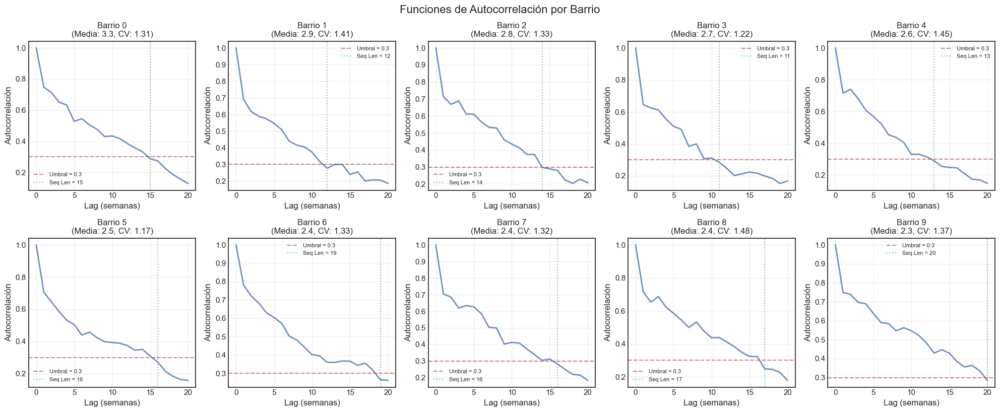

📊 RECOMENDACIÓN DE SEQUENCE_LENGTH POR BARRIO


,BARRIO_ID,SEQUENCE_LENGTH,MEDIA_DENGUE,COEF_VARIACION,CATEGORIA_VOLATILIDAD
0,0,15,3.315217,1.307293,Media
1,1,12,2.850543,1.412385,Media
2,2,14,2.752717,1.329908,Media
3,3,11,2.668478,1.218098,Media
4,4,13,2.605978,1.449407,Media
5,5,16,2.464674,1.167647,Media
6,6,19,2.399457,1.326911,Media
7,7,16,2.350543,1.317518,Media
8,8,17,2.372283,1.476069,Media
9,9,20,2.315217,1.374295,Media



🔍 ANÁLISIS DE AGRUPACIÓN NATURAL
                      SEQUENCE_LENGTH               BARRIO_ID
                            mean       std  min max   count  
CATEGORIA_VOLATILIDAD                                        
Media                       15.3       2.91  11  20     10   

🎯 RECOMENDACIONES FINALES
• Rango de SEQUENCE_LENGTH: 11 - 20 semanas
• Promedio general: 15.3 semanas
• Mediana: 15.5 semanas

💡 SUGERENCIA: Considera agrupar en 3 categorías:
   - Grupo 1 (Corto): ≤ 14 semanas
   - Grupo 2 (Medio): 14 - 16 semanas
   - Grupo 3 (Largo): > 16 semanas

✅ Análisis completado. Los SEQUENCE_LENGTH están listos para usar en tu modelo de red neuronal.


In [36]:
from statsmodels.tsa.stattools import acf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

def calcular_sequence_length_optimo(df, umbral_acf=0.3, max_lags=60, visualizar=True):
    """
    Calcula SEQUENCE_LENGTH óptimo por barrio usando autocorrelación
    
    Parameters:
    -----------
    df : pandas.DataFrame
        DataFrame con columnas 'id_bar', 'fecha_dt', 'dengue'
    umbral_acf : float
        Umbral de autocorrelación para corte (default: 0.3)
    max_lags : int
        Máximo número de lags a evaluar (default: 60)
    visualizar : bool
        Si mostrar gráficos de autocorrelación
    
    Returns:
    --------
    dict : Diccionario con resultados por barrio
    """
    
    # Diccionarios para guardar resultados
    sequence_length_por_barrio = {}
    acf_completa_por_barrio = {}
    estadisticas_por_barrio = {}
    
    # Configurar visualización si se solicita
    if visualizar:
        fig, axes = plt.subplots(2, 5, figsize=(20, 8))
        axes = axes.flatten()
    
    for i, barrio in enumerate(sorted(df['id_bar'].unique())):
        # Extraer y ordenar serie temporal
        serie = df[df['id_bar'] == barrio].sort_values('fecha_dt')['dengue']
        
        # Verificar que la serie tenga suficientes datos
        if len(serie) < max_lags:
            print(f"⚠️  Barrio {barrio}: Serie muy corta ({len(serie)} obs), usando máximo disponible")
            max_lags_barrio = len(serie) - 1
        else:
            max_lags_barrio = max_lags
        
        # Calcular autocorrelación
        try:
            acf_vals = acf(serie, nlags=max_lags_barrio, fft=True)
            acf_completa_por_barrio[barrio] = acf_vals
            
            # Buscar primer lag donde autocorrelación cae por debajo del umbral
            sequence_length = max_lags_barrio  # Valor por defecto
            for lag in range(1, len(acf_vals)):
                if acf_vals[lag] < umbral_acf:
                    sequence_length = lag
                    break
            
            sequence_length_por_barrio[barrio] = sequence_length
            
            # Calcular estadísticas adicionales
            estadisticas_por_barrio[barrio] = {
                'acf_max': np.max(acf_vals[1:11]),  # ACF máximo en primeros 10 lags
                'acf_min': np.min(acf_vals[1:11]),  # ACF mínimo en primeros 10 lags
                'persistencia': np.sum(acf_vals[1:] > umbral_acf),  # Número de lags significativos
                'media_serie': serie.mean(),
                'std_serie': serie.std(),
                'cv_serie': serie.std() / serie.mean() if serie.mean() > 0 else np.inf
            }
            
            # Visualizar si se solicita
            if visualizar and i < 10:
                axes[i].plot(range(min(21, len(acf_vals))), acf_vals[:min(21, len(acf_vals))], 
                           'b-', alpha=0.8, linewidth=2)
                axes[i].axhline(y=umbral_acf, color='r', linestyle='--', alpha=0.7, 
                              label=f'Umbral = {umbral_acf}')
                axes[i].axvline(x=sequence_length, color='g', linestyle=':', alpha=0.7,
                              label=f'Seq Len = {sequence_length}')
                axes[i].set_title(f'Barrio {barrio}\n(Media: {serie.mean():.1f}, CV: {estadisticas_por_barrio[barrio]["cv_serie"]:.2f})')
                axes[i].set_xlabel('Lag (semanas)')
                axes[i].set_ylabel('Autocorrelación')
                axes[i].grid(True, alpha=0.3)
                axes[i].legend(fontsize=8)
                
        except Exception as e:
            print(f"❌ Error procesando barrio {barrio}: {e}")
            sequence_length_por_barrio[barrio] = 12  # Valor por defecto conservador
    
    if visualizar:
        plt.tight_layout()
        plt.suptitle('Funciones de Autocorrelación por Barrio', y=1.02, fontsize=16)
        plt.show()
    
    return sequence_length_por_barrio, acf_completa_por_barrio, estadisticas_por_barrio

def analizar_resultados_sequence_length(sequence_lengths, estadisticas, df):
    """
    Analiza y presenta los resultados de SEQUENCE_LENGTH
    """
    # Crear DataFrame de resultados
    resultados = []
    for barrio in sorted(sequence_lengths.keys()):
        stats = estadisticas[barrio]
        resultados.append({
            'BARRIO_ID': barrio,
            'SEQUENCE_LENGTH': sequence_lengths[barrio],
            'MEDIA_DENGUE': stats['media_serie'],
            'STD_DENGUE': stats['std_serie'],
            'COEF_VARIACION': stats['cv_serie'],
            'PERSISTENCIA_ACF': stats['persistencia'],
            'ACF_MAX_10LAGS': stats['acf_max'],
            'CATEGORIA_VOLATILIDAD': 'Alta' if stats['cv_serie'] > 1.5 else 'Media' if stats['cv_serie'] > 1.0 else 'Baja'
        })
    
    summary_df = pd.DataFrame(resultados)
    
    # Mostrar resultados principales
    print("📊 RECOMENDACIÓN DE SEQUENCE_LENGTH POR BARRIO")
    print("="*60)
    display(summary_df[['BARRIO_ID', 'SEQUENCE_LENGTH', 'MEDIA_DENGUE', 'COEF_VARIACION', 'CATEGORIA_VOLATILIDAD']])
    
    # Análisis de agrupación
    print("\n🔍 ANÁLISIS DE AGRUPACIÓN NATURAL")
    print("="*60)
    
    grupos = summary_df.groupby('CATEGORIA_VOLATILIDAD').agg({
        'SEQUENCE_LENGTH': ['mean', 'std', 'min', 'max'],
        'BARRIO_ID': 'count'
    }).round(2)
    
    print(grupos)
    
    # Recomendaciones finales
    print("\n🎯 RECOMENDACIONES FINALES")
    print("="*60)
    
    seq_lengths = summary_df['SEQUENCE_LENGTH'].values
    
    print(f"• Rango de SEQUENCE_LENGTH: {seq_lengths.min()} - {seq_lengths.max()} semanas")
    print(f"• Promedio general: {seq_lengths.mean():.1f} semanas")
    print(f"• Mediana: {np.median(seq_lengths):.1f} semanas")
    
    # Sugerencia de agrupación para eficiencia computacional
    if len(np.unique(seq_lengths)) > 5:
        print(f"\n💡 SUGERENCIA: Considera agrupar en 3 categorías:")
        percentiles = np.percentile(seq_lengths, [33, 67])
        print(f"   - Grupo 1 (Corto): ≤ {percentiles[0]:.0f} semanas")
        print(f"   - Grupo 2 (Medio): {percentiles[0]:.0f} - {percentiles[1]:.0f} semanas") 
        print(f"   - Grupo 3 (Largo): > {percentiles[1]:.0f} semanas")
    
    return summary_df

# Uso del código:
# ================

# 1. Calcular SEQUENCE_LENGTH por barrio
sequence_lengths, acf_data, estadisticas = calcular_sequence_length_optimo(
    df, 
    umbral_acf=0.3, 
    max_lags=60, 
    visualizar=True
)

# 2. Analizar resultados
summary_df = analizar_resultados_sequence_length(sequence_lengths, estadisticas, df)

# 3. Guardar resultados para uso en modelo
# summary_df.to_csv('sequence_lengths_por_barrio.csv', index=False)

print("\n✅ Análisis completado. Los SEQUENCE_LENGTH están listos para usar en tu modelo de red neuronal.")

#### **Interpretación de Patrones Identificados**

*Hallazgo Sorprendente: Homogeneidad Temporal:*
Contrario a la expectativa inicial, no existe correlación clara entre volatilidad y memoria temporal:

* Barrio 4: Alta variabilidad (CV=1.45) pero memoria corta (13 semanas)
* Barrio 9: Variabilidad moderada (CV=1.37) pero memoria larga (20 semanas)
* Barrio 5: Baja variabilidad (CV=1.17) con memoria media (16 semanas)

*Patrón Epidemiológico Subyacente:*
La **convergencia hacia 15.3 semanas** promedio sugiere:

* Dinámicas de transmisión similares entre barrios
* Ciclos epidemiológicos comunes (~3.5-4 meses)
* Influencia de factores climáticos estacionales homogénea

*3. *Correlación Inversa: Incidencia vs Memoria Temporal:*
Se observa una tendencia interesante

* Barrios de mayor incidencia (0-2): Memoria más corta (11-15 semanas)
* Barrios de menor incidencia (6-9): Memoria más larga (16-20 semanas)

**Interpretación epidemiológica:** Los barrios con transmisión intensa tienen **patrones más directos y rápidos**, mientras que barrios con transmisión esporádica requieren **mayor contexto histórico** para detectar señales predictivas.

#### **Agrupación Estratégica (Recomendada)**
- **Grupo Corto** ≤14 sem: Barrios 1,2,3,4 → **SEQUENCE_LENGTH = 13**
- **Grupo Medio** 15-16 sem: Barrios 0,5,7 → **SEQUENCE_LENGTH = 16** 
- **Grupo Largo** >16 sem: Barrios 6,8,9 → **SEQUENCE_LENGTH = 18**